# Meeting (and not meeting) the assumptions of linear regression

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
from sqlalchemy import create_engine
import warnings
import ds_useful    # My own combination of useful data science functions, usually applicable to the EDA and feature engineering process

warnings.filterwarnings('ignore')
sns.set(style="whitegrid")

[My Useful Data Science Functions](https://github.com/cobyoram/python-for-data-scientists/blob/master/ds_useful.py)

# part 1

In [9]:
# Establish postgres access details
postgres_user = 'dsbc_student'
postgres_pw = '7*.8G9QH21'
postgres_host = '142.93.121.174'
postgres_port = '5432'
postgres_db = 'weatherinszeged'
table = 'weatherinszeged'
# Start the engine and connect to the database
engine = create_engine('postgresql://{}:{}@{}:{}/{}'.format(
    postgres_user, postgres_pw, postgres_host, postgres_port, postgres_db))

# Perform a select query
df = pd.read_sql_query('SELECT * FROM {}'.format(table), con=engine)

# Dispose the engine. We don't need it anymore
engine.dispose()

In [10]:
target = 'temperature'
features = ['humidity', 'windspeed', 'windbearing', 'pressure']

Y = df[target]
X = df[features]

In [11]:
from sklearn import linear_model

lrm = linear_model.LinearRegression()
lrm.fit(X, Y)

print('\nCoefficients: \n', lrm.coef_)
print('\nIntercept: \n', lrm.intercept_)


Coefficients: 
 [-3.24962454e+01 -2.01413742e-01  4.04836936e-03 -6.91759209e-04]

Intercept: 
 37.92643818528529


## Assumption one: linearity of the model in its coefficients


In [12]:
# Literally who knows

## Assumption two: the error term should be zero on average

In [13]:
predictions = lrm.predict(X)
errors = Y - predictions
print('Mean of the errors in the model is: {}'.format(np.mean(errors)))

print('This satisfies the assumption of zero avg error and it means that the errors are due to chance, not some correlation with the features or target')

Mean of the errors in the model is: -9.806584448838764e-16
This satisfies the assumption of zero avg error and it means that the errors are due to chance, not some correlation with the features or target


## Assumption three: homoscedasticity


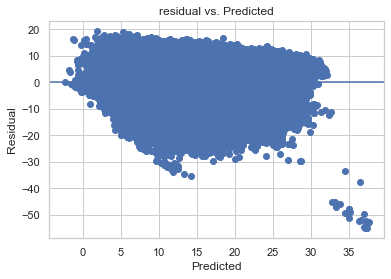

Bartlett test statistic value is 2464.84 and p value is 0
Levene test statistic value is 2321.24 and p value is 0
Low p-values mean we reject null hypothesis. Our errors are HETEROscedastic. Fail to meet assumptionn. Maybe I should transform something?


In [14]:
from scipy.stats import bartlett, levene

plt.scatter(predictions, errors)
plt.xlabel('Predicted')
plt.ylabel('Residual')
plt.axhline(y=0)
plt.title('residual vs. Predicted')
plt.show()

bart_stats = bartlett(predictions, errors)
lev_stats = levene(predictions, errors)

print('Bartlett test statistic value is {0:3g} and p value is {1:.3g}'.format(bart_stats[0], bart_stats[1]))
print('Levene test statistic value is {0:3g} and p value is {1:.3g}'.format(lev_stats[0], lev_stats[1]))

print('Low p-values mean we reject null hypothesis. Our errors are HETEROscedastic. Fail to meet assumptionn. Maybe I should transform something?')

## Assumption four: low multicollinearity


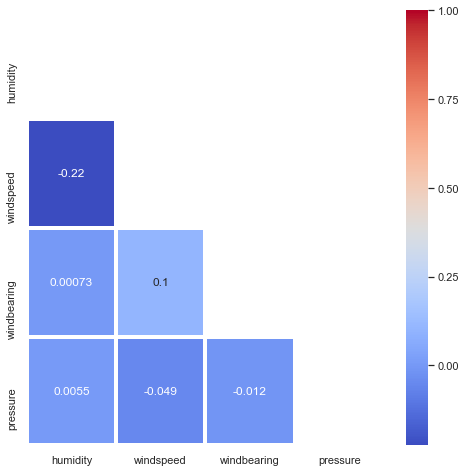

Humitity and windspeed are the most correlated, but I'd say the assumption is still met


In [17]:
corr = X.corr()

plt.figure(figsize=[8, 8])
mask = np.triu(np.ones_like(corr, dtype=np.bool))
sns.heatmap(corr, mask=mask, annot=True, linewidths=3, cmap='coolwarm')
plt.show()

print('Humitity and windspeed are the most correlated, but I\'d say the assumption is still met')

## Assumption five: error terms should be uncorrelated with one another


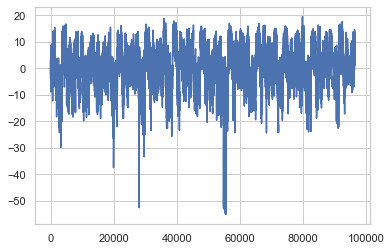

In [18]:
plt.plot(errors)

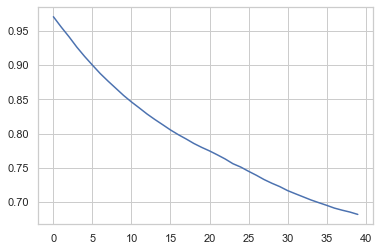

In [19]:
from statsmodels.tsa.stattools import acf

acf_data = acf(errors)

plt.plot(acf_data[1:])
plt.show()

In [20]:
print('The autocorrelation ranges from .95 to about .65')
print('There is a correlation between error terms, meaning this dataset does not pass the assumption')

The autocorrelation ranges from .95 to about .65
There is a correlation between error terms, meaning this dataset does not pass the assumption


## Assumption six: features shouldn't be correlated with the errors


In [ ]:
# I don't get how to do this though.

# part 2

## Load the dataset

In [2]:
# Establish postgres access details
postgres_user = 'dsbc_student'
postgres_pw = '7*.8G9QH21'
postgres_host = '142.93.121.174'
postgres_port = '5432'
postgres_db = 'houseprices'

# Start the engine and connect to the database
engine = create_engine('postgresql://{}:{}@{}:{}/{}'.format(
    postgres_user, postgres_pw, postgres_host, postgres_port, postgres_db))

# Perform a select query
df = pd.read_sql_query('SELECT * FROM houseprices', con=engine)

# Dispose the engine. We don't need it anymore
engine.dispose()

## Clean the dataset

In [3]:
# Identify the percentage of missing data in each row
missings = ds_useful.missingness_summary(df)

# Create a smaller dataframe, dropping columns with more than 5% missing data
short_df = df.drop(missings.loc[missings > 5].index, axis=1)
ds_useful.missingness_summary(short_df)

# Drop variables that are highly correlated with each other
short_df = ds_useful.remove_correlated_features(short_df, 'saleprice', .7)

# Drop variable columns that are more than 25% zeros
repeats = ds_useful.repeats_summary(short_df.drop('saleprice', axis=1), value=0)
short_df.drop(repeats.loc[repeats > 25].index, axis=1, inplace=True)

# Drop variable columns whose mode is extremely repetitive (more than 25% occurence)
mode_repeats = ds_useful.repeats_summary(short_df.drop('saleprice', axis=1).select_dtypes('number'), value_agg='mode')
short_df.drop(mode_repeats.loc[mode_repeats > 25].index, axis=1, inplace=True)

# Check again for missing rows:
new_missings = ds_useful.missingness_summary(short_df)

# Investigate datatype for each variable with any missing data
miss_cols = new_missings.loc[new_missings > 0].index
# short_df.loc[:,miss_cols].info()

# Since they are all categorical, we'll fill them with the mode, or drop them
ds_useful.missingness_summary(short_df[miss_cols])

# For each column with missing data, identify its node and then fill the nulls with that mode
for col in miss_cols:
    mode = short_df.loc[short_df[col] != np.nan, col].mode().iloc[0]
    short_df[col].fillna(mode, inplace=True)

# Identify outliers
ds_useful.outliers_summary(short_df, 1.5)

# Because there are outliers in the target variable, we will simply drop outliers so as not to affect our model
short_df = ds_useful.drop_outliers(short_df, 1.5)

# One-hot-encode stuff
Y = short_df['saleprice']
X = pd.get_dummies(short_df.drop('saleprice', axis=1).select_dtypes('object'), drop_first=True)
for col in short_df.drop('saleprice', axis=1).select_dtypes('number').columns:
    X[col] = short_df[col]

print('\n\ntarget:\n', Y.head(), '\n\nfeatures:')
X.head()



target:
 0    208500
1    181500
2    223500
3    140000
4    250000
Name: saleprice, dtype: int64 

features:


,mszoning_FV,mszoning_RH,mszoning_RL,mszoning_RM,street_Pave,lotshape_IR2,lotshape_IR3,lotshape_Reg,landcontour_HLS,landcontour_Low,...,salecondition_Partial,id,lotarea,yearbuilt,yearremodadd,bsmtunfsf,totalbsmtsf,grlivarea,mosold,yrsold
0,0,0,1,0,1,0,0,1,0,0,...,0,1,8450,2003,2003,150,856,1710,2,2008
1,0,0,1,0,1,0,0,1,0,0,...,0,2,9600,1976,1976,284,1262,1262,5,2007
2,0,0,1,0,1,0,0,0,0,0,...,0,3,11250,2001,2002,434,920,1786,9,2008
3,0,0,1,0,1,0,0,0,0,0,...,0,4,9550,1915,1970,540,756,1717,2,2006
4,0,0,1,0,1,0,0,0,0,0,...,0,5,14260,2000,2000,490,1145,2198,12,2008


### Regression Model

In [4]:
import statsmodels.api as sm

# We need to manually add a constant
# in statsmodels' sm
X = sm.add_constant(X)

results = sm.OLS(Y, X).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              saleprice   R-squared:                       0.927
Model:                            OLS   Adj. R-squared:                  0.915
Method:                 Least Squares   F-statistic:                     77.38
Date:                Mon, 17 Feb 2020   Prob (F-statistic):               0.00
Time:                        16:23:56   Log-Likelihood:                -13943.
No. Observations:                1260   AIC:                         2.824e+04
Df Residuals:                    1082   BIC:                         2.916e+04
Df Model:                         177                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                 -1.109e+06   8.09e+05     -1.372      0.170    -2.7e+06    4.78e+05
mszoning_FV            3.596e+04   9088.016      3.957      0.000    1.81e+04    5.38e+04
mszoning_RH            3.873e+04   8923.456      4.340      0.000    2.12e+04    5.62e+04
mszoning_RL            3.963e+04   7641.193      5.186      0.000    2.46e+04    5.46e+04
mszoning_RM            3.124e+04   7128.843      4.382      0.000    1.73e+04    4.52e+04
street_Pave            6014.9128   1.24e+04      0.485      0.628   -1.83e+04    3.04e+04
lotshape_IR2          -3010.0391   3843.770     -0.783      0.434   -1.06e+04    4532.048
lotshape_IR3          -1702.3157   8430.926     -0.202      0.840   -1.82e+04    1.48e+04
lotshape_Reg            858.9712   1271.835      0.675      0.500   -1636.572    3354.514
landcontour_HLS         685.4710   4367.661      0.157      0.875   -7884.573    9255.515
landcontour_Low       -9180.5362   5591.514     -1.642      0.101   -2.02e+04    1790.902
landcontour_Lvl       -3042.8953   3003.904     -1.013      0.311   -8937.033    2851.242
utilities_NoSeWa      -1.552e+04   1.84e+04     -0.845      0.398   -5.16e+04    2.05e+04
lotconfig_CulDSac      1517.5088   2614.058      0.581      0.562   -3611.689    6646.707
lotconfig_FR2         -1.051e+04   3076.687     -3.414      0.001   -1.65e+04   -4468.134
lotconfig_FR3         -1.448e+04   9264.737     -1.563      0.118   -3.27e+04    3695.045
lotconfig_Inside      -1501.2258   1377.160     -1.090      0.276   -4203.433    1200.981
landslope_Mod          2638.9642   3351.553      0.787      0.431   -3937.316    9215.244
landslope_Sev         -2.677e+04   1.27e+04     -2.112      0.035   -5.16e+04   -1895.325
neighborhood_Blueste   2.051e+04   1.95e+04      1.051      0.293   -1.78e+04    5.88e+04
neighborhood_BrDale    1.025e+04   7985.630      1.283      0.200   -5420.133    2.59e+04
neighborhood_BrkSide   9690.4070   6915.777      1.401      0.161   -3879.446    2.33e+04
neighborhood_ClearCr  -1.069e+04   7364.756     -1.452      0.147   -2.51e+04    3760.296
neighborhood_CollgCr  -1.057e+04   5166.877     -2.046      0.041   -2.07e+04    -433.849
neighborhood_Crawfor   1.994e+04   6409.503      3.110      0.002    7360.193    3.25e+04
neighborhood_Edwards  -1.787e+04   5833.886     -3.064      0.002   -2.93e+04   -6425.921
neighborhood_Gilbert  -1.142e+04   5677.090     -2.011      0.045   -2.26e+04    -279.861
neighborhood_IDOTRR    3544.0504   7925.698      0.447      0.655    -1.2e+04    1.91e+04
neighborhood_MeadowV  -1.673e+04   8212.799     -2.037      0.042   -3.28e+04    -617.935
neighborhood_Mitchel  -1.498e+04   6043.963     -2.478      0.013   -2.68e+04   -3116.875
neighborhood_NAmes    -1.156e+04   5697.077     -2.030      0.043   -2.27e+04    -386.007
neighborhood_NPkVill   

## Assumption one: linearity of the model in its coefficients

1260
1260


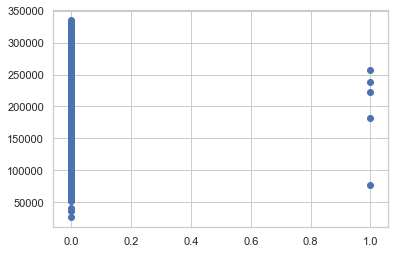

In [5]:
# Use the calculated coefficients to test linear relationship with features??????
params = pd.DataFrame(results.params, columns=['parameters'], index=results.params.index)
predictions = results.predict(X)
print(len(X))
print(len(predictions))

plt.scatter(X.iloc[:,7], predictions)
# plt.scatter(params, sm.add_constant(results.predict()))
# Figure out how to even test this

## Assumption two: the error term should be zero on average

In [6]:
errors = Y - predictions
print('Mean of the errors is:', errors.mean())
print('This is close to zero, so we can say our data meets zero error assumption')

Mean of the errors is: -3.132320541356291e-08
This is close to zero, so we can say our data meets zero error assumption


## Assumption three: homoscedasticity

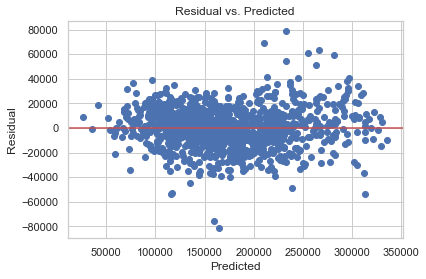

In [7]:
plt.scatter(predictions, errors)
plt.xlabel('Predicted')
plt.ylabel('Residual')
plt.axhline(y=0,color='r')
plt.title('Residual vs. Predicted')
plt.show()

In [8]:
from scipy.stats import bartlett
from scipy.stats import levene

bart_stats = bartlett(predictions, errors)
lev_stats = levene(predictions, errors)

print("Bartlett test statistic value is {0:3g} and p value is {1:.3g}".format(bart_stats[0], bart_stats[1]))
print("Levene test statistic value is {0:3g} and p value is {1:.3g}".format(lev_stats[0], lev_stats[1]))

print('\nThe p-value is very low, so we can reject the null hypothesis which means our data is heteroscedastic')
print('Our data does not meet the homoscedasticity assumption')

Bartlett test statistic value is 1641.14 and p value is 0
Levene test statistic value is 1009.98 and p value is 1.17e-186

The p-value is very low, so we can reject the null hypothesis which means our data is heteroscedastic
Our data does not meet the homoscedasticity assumption


## Assumption four: low multicollinearity


The data was handled to meet this assumption when I called
    
    short_df = ds_useful.remove_correlated_features(short_df, 'saleprice', .7)

## Assumption five: error terms should be uncorrelated with one another

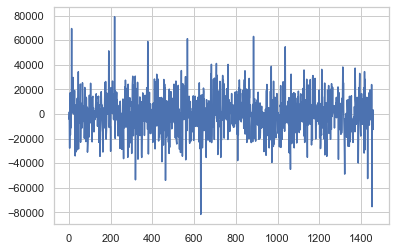

In [9]:
# First we'll simply plot the errors to see visually if they look correlated
plt.plot(errors)
plt.show()

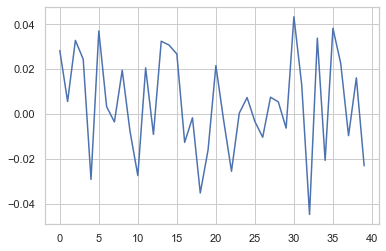

correlation ranges between -0.04482551218704952 and 0.04336697193403666
Definitely meets the uncorrelated errors assumption


In [17]:
# We'll also try using statsmodels autocorrelation function
from statsmodels.tsa.stattools import acf

acf_data = acf(errors)

plt.plot(acf_data[1:])
plt.show()

print(f'correlation ranges between {acf_data[1:].min()} and {acf_data[1:].max()}')
print('Definitely meets the uncorrelated errors assumption')

## Assumption six: features shouldn't be correlated with the errors

??????